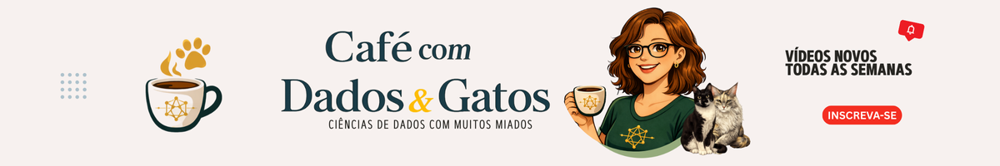

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from sklearn.datasets import fetch_california_housing
from sklearn.preprocessing import StandardScaler

In [2]:
# 1) Dataset California Housing
housing = fetch_california_housing()
X_all = housing.data
y = housing.target.astype(float)  # target: preço (em centenas de milhares)

# 2) 1 feature (MedInc)
# Colunas do dataset: MedInc, HouseAge, AveRooms, AveBedrms, Population, AveOccup, Latitude, Longitude
feat_idx = 0  # MedInc
X = X_all[:, feat_idx].reshape(-1, 1)

# 3) Subamostra pra ficar mais leve/limpo no vídeo
np.random.seed(42)
idx = np.random.choice(len(X), size=1200, replace=False)
X = X[idx]
y = y[idx]

# 4) Padroniza X (ajuda SGD)
X = StandardScaler().fit_transform(X)

# 5) Parâmetros do modelo y = w*x + b
w, b = 0.0, 0.0
lr = 0.03

# 6) Figura com 2 painéis: dados+linha e loss
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

ax1.scatter(X[:, 0], y, s=10, alpha=0.7)
ax1.set_title("SGD aprendendo (California Housing)")
ax1.set_xlabel("MedInc (normalizado)")
ax1.set_ylabel("Preço (target)")

line, = ax1.plot([], [], linewidth=2)

ax2.set_title("Loss (MSE) descendo")
ax2.set_xlabel("step")
ax2.set_ylabel("MSE")
loss_line, = ax2.plot([], [], linewidth=2)

loss_hist = []

def mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

def update(step):
    global w, b

    # SGD: 1 amostra por passo
    i = step % len(X)
    x_i = X[i, 0]
    y_i = y[i]

    # predição
    y_hat = w * x_i + b
    err = y_hat - y_i

    # gradientes (1 amostra)
    dw = err * x_i
    db = err

    # update
    w -= lr * dw
    b -= lr * db

    # linha do modelo
    xx = np.array([X[:, 0].min(), X[:, 0].max()])
    yy = w * xx + b
    line.set_data(xx, yy)

    # loss global (no dataset todo) = sentido do "aprendeu"
    y_pred = w * X[:, 0] + b
    current_loss = mse(y, y_pred)
    loss_hist.append(current_loss)

    loss_line.set_data(np.arange(len(loss_hist)), loss_hist)
    ax2.set_xlim(0, max(50, len(loss_hist)))
    ax2.set_ylim(min(loss_hist) * 0.98, max(loss_hist) * 1.02)

    return line, loss_line

plt.tight_layout()
ani = animation.FuncAnimation(fig, update, frames=140, interval=80, blit=True)

plt.close(fig)
HTML(ani.to_jshtml())